In [23]:
import earthpy.spatial as es
import numpy as np
import os, sys
import geopandas as gpd
import rasterio as rio
from shapely.geometry import box
from glob import glob
from tqdm import tqdm
import matplotlib.pyplot as plt
from rasterio.plot import reshape_as_image, show


In [73]:
# Run a conservative cloud detection
def qa_pixel_interp_conservative(number):
    '''
    Helps interpret the 16bit data in the landsat qa pixels
    
    returns True if there is mid confidence cirrus, snow/ice, cloud shadow, OR clouds
    '''
    binary = bin(number)[2:].zfill(16)
    
    # if high confidence cirrus, snow/ice, cloud shadow, and clouds
    # 01 - low, 10 - medium, 11 - high
    if int(binary[:2]) > 10:
        return True
    elif int(binary[2:4]) > 10:
        return True
    elif int(binary[4:6]) > 10:
        return True
    elif int(binary[6:8]) > 10:
        return True
    else:
        return False
    
def qa_pixel_interp_conserv_water(number):
    '''
    Helps interpret the 16bit data in the landsat qa pixels
    
    returns True if there is mid confidence cirrus, snow/ice, cloud shadow, clouds OR WATER
    '''
    binary = bin(number)[2:].zfill(16)
    
    # if high confidence cirrus, snow/ice, cloud shadow, and clouds
    # 01 - low, 10 - medium, 11 - high
    if int(binary[:2]) > 10:
        return True
    elif int(binary[2:4]) > 10:
        return True
    elif int(binary[4:6]) > 10:
        return True
    elif int(binary[6:8]) > 10:
        return True
    # if water return true
    elif int(binary[8]) == 1:
        return True
    else:
        return False
    
def apply_array_func(func, x):
    '''
    Applies a function element-wise across a 1D array
    '''
    return np.array([func(xi) for xi in x])

def cloud_removal_mosaic(target_dir, func, suffix = "MASKED"):
    '''
    target dir should contain all the stacked band files + QA pixel files
    func indicates the cloud classification function that should be applied to the QA pixel file
        this can be aggressive, conservative, or conservative while also removing water
    '''
    
    mb_raster_list = []
    qa_raster_list = []
    
    # search files recursively, so it doesn't matter where in the folder the file is
    stack = glob(
        os.path.join(
            target_dir,
            "**/*STACKED.tif"
        ), recursive = True
    )

    # this is automatically sorted by date - in other words, the base layer is the earliest image (usually feb) and the
    # mosaicking will take bits from the other images in order from earliest to latest (i.e., bits from the youngest image
    # will be the last to be mosaicked). This automatically means that the base layer will filled in starting from the images
    # closest in date to the original image. May wish to consider alternative sorting methods
    mb_raster_list = stack

    stack = glob(
        os.path.join(
            target_dir,
            "**/*QA_PIXEL_crop.tif"
        ), recursive = True
    )
    
    qa_raster_list = stack
    
    
    # check if there are the same number of multiband and qa rasters
    if len(mb_raster_list) != len(qa_raster_list):
#         scene = [i for i in zip(mb_raster_list, qa_raster_list)]
#     else:
        print("there were a different number of stacked rasters and qa_pixel files - please check to ensure that you have \
              the correct files in the target folder")
    
    # turn the list of mb_rasters into a 4D data tesseract    
    stacked_mb_raster = None

    for mb_raster in mb_raster_list:
        with rio.open(mb_raster) as src:
            stacked_bands = src.read()
            src.close()

        # Need to expand dimensions in preparation for np.vstack
        stacked_bands = np.expand_dims(stacked_bands, axis=0)
        # print(stacked_bands.shape)

        if stacked_mb_raster is None:
            stacked_mb_raster = stacked_bands
        else:
            # need to use vstack instead of stack, because stack expands the dims of the 
            # stacked_mb_raster, and thus they cannot be combined properly with stacked_bands later
            stacked_mb_raster = np.vstack((stacked_mb_raster, stacked_bands))
    
    # We now want to do the same thing with the QA bands, turning them into a 3D data cube 
    stacked_qa_raster = None

    for qa_raster in qa_raster_list:
        with rio.open(qa_raster) as src:
            # This reads the stacked_qa as a 1 x 1113 x 1824 raster
            stacked_qa = src.read()
            src.close()

        # We need to stack the qa mask 8 times - one for each band of the multiband raster
        stacked_qa = np.repeat(stacked_qa, 8, axis=0)

        # Need to expand dimensions in preparation for np.vstack
        stacked_qa = np.expand_dims(stacked_qa, axis=0)

        if stacked_qa_raster is None:
            stacked_qa_raster = stacked_qa
        else:
            # need to use vstack instead of stack, because stack expands the dims of the 
            # stacked_mb_raster, and thus they cannot be combined properly with stacked_bands later
            stacked_qa_raster = np.vstack((stacked_qa_raster, stacked_qa))
    
    # classify the QA raster using conservative cloud estimates
    unique_vals = np.unique(stacked_qa_raster)
    masked_vals = apply_array_func(func, unique_vals)
    masked_vals = unique_vals[masked_vals]
    cl_mask = np.isin(stacked_qa_raster, masked_vals)
    
    # cl_mask is an (N, 8, height, width) shaped numpy array that can be used as a mask for the above data
    
    # use cl_mask as a mask for the stacked_mb_raster
    # remember to turn stacked_mb_raster into float32 or else it will not be able to accept np.nan
    masked_mb_raster = np.ma.masked_array(stacked_mb_raster.astype(np.float32), cl_mask)
    
    # The base scene is the first layer (2022-04-01)
    base_scene = masked_mb_raster[0, ...]
    
    # for each scene
    for layer_num in range(masked_mb_raster.shape[0] - 1):
        # Takes the base scene and fills the missing with stuff from layer 2
        result = np.ma.filled(base_scene, 
                              # this fills missing data in layer 2 with nans
                              # if there is missing data in the same coord in both layers, then 
                              # then the result array will have a np.nan in that coord
                              np.ma.filled(masked_mb_raster[layer_num + 1, :], fill_value = np.nan)
                             )
        
        # turn result back into a masked array, where np.nan are the values to be masked.
        result_mask = np.isnan(result)

        # Rename it base_scene for the loop to work
        base_scene = np.ma.masked_array(result, result_mask)
    
    # At the end, base_scene should be a single 8 x 1113 x 1824 masked raster
    
    # write base scene to disk
    with rio.open(mb_raster_list[0]) as src:
        profile = src.profile
        src.close()
    
    profile.update(nodata = np.nan, dtype = np.float32)
    
    with rio.open(
        os.path.join(target_dir, f"{os.path.basename(target_dir)}_{suffix}.tif"),
        "w",
        **profile
    ) as dst:
        dst.write(base_scene)
        # try this to write mask - it looks like you have to invert the mask when passing it into 
        # dst.write_mask - unsure why
        dst.write_mask(np.logical_not(np.ma.getmask(base_scene[0,...])))
        dst.close()
    
    return base_scene

In [75]:
%%time
base_scenes = []

for path in os.listdir('./data_collated'):
    final_scene = cloud_removal_mosaic(os.path.join(os.getcwd(), 'data_collated', path), qa_pixel_interp_conservative, "CONSCLOUD_MASKED")
    base_scenes.append(final_scene)

CPU times: total: 29.6 s
Wall time: 32.7 s


In [74]:
%%time
base_scenes = []

for path in os.listdir('./data_collated'):
    final_scene = cloud_removal_mosaic(os.path.join(os.getcwd(), 'data_collated', path), qa_pixel_interp_conserv_water, "WATER_MASKED")
    base_scenes.append(final_scene)

CPU times: total: 28.5 s
Wall time: 32.4 s


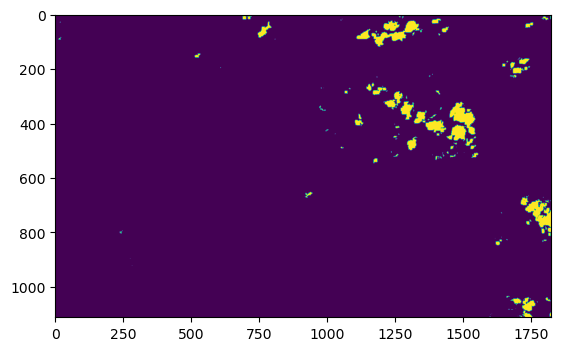

<Axes: >

In [76]:
show(np.ma.getmask(base_scenes[0][0,...]))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


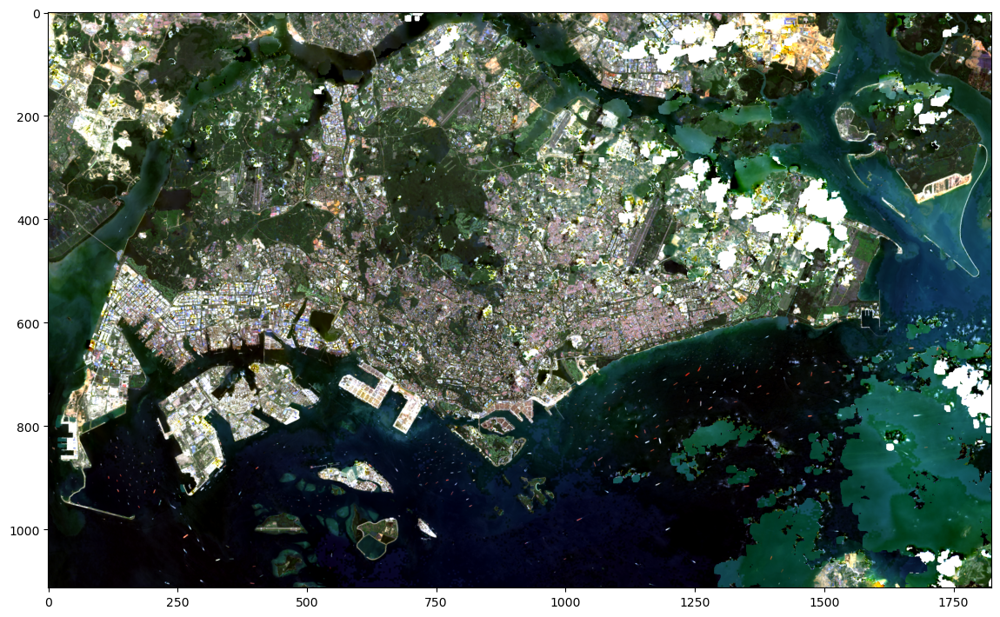

<Axes: >

In [24]:
### Check the result of base_scene using a TCC ###

def histogram_stretch(img, min_vals = None, max_vals = 99):
    """
    Performs a histogram_stretch on an image. DO NOT use this for analytical workflows - 
    this should only be used to improve image visualization
    
    img: an unmasked 3D raster 
    
    min_vals: percentile that you wish to crop to
        will be np.zeros by default
    max_vals: percentile that you wish to crop to
        will be np.nanpercentile(img, 99) by default # crops to 99th percentile
    """
    if img.ndim != 3:
        print("ValueError: Your raster must have three dimensions.")
        return
    
    # This returns the max_valth percentile
    max_vals = np.nanpercentile(img, max_vals, axis = (1,2)).reshape(img.shape[0],1,1) 
    # min_vals = np.nanmin(tcc_toa, axis = (1,2)).reshape(3,1,1) # Use this to stretch to minimum values
    if min_vals is not None:
        min_vals = np.nanpercentile(img, min_vals, axis = (1,2)).reshape(img.shape[0],1,1)
    else:
        min_vals = np.zeros(img.shape[0]).reshape(img.shape[0],1,1)
    
    # Perform normalization
    img_stretched = (img - min_vals) / (max_vals - min_vals)
    
    # Clip values above 1
    img_stretched[img_stretched > 1] = 1
    
    return img_stretched

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


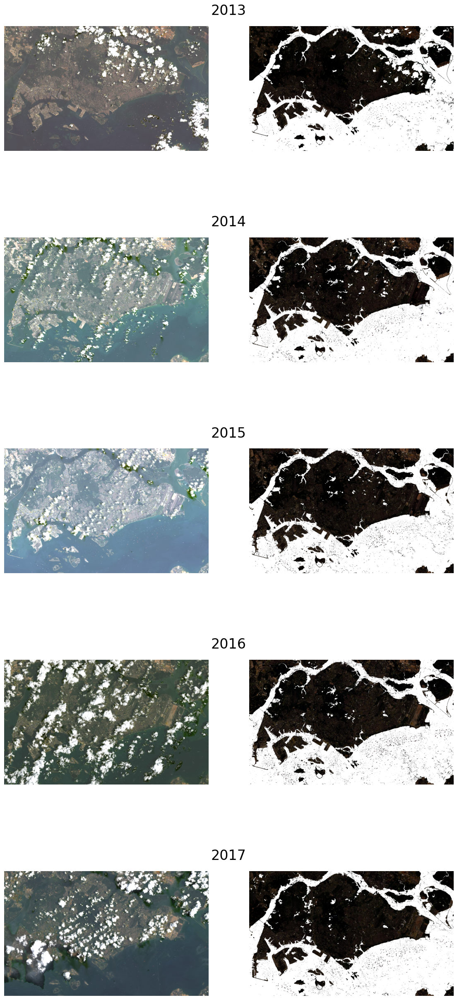

In [66]:
### Plot before/after moisaicking
fig, ax = plt.subplots(nrows = 5, ncols = 2, figsize = (14, 32))

axs = ax.flatten()

years = [str(year) for year in range(2013, 2018)]

for axis_num, axis in enumerate(axs):
    axis.axis("off")
    if axis_num % 2 == 0:
        target_file = glob(os.path.join(os.getcwd(), "data_collated", f"{years[axis_num//2]}", "**/*STACKED.tif"), recursive = True)[0]
        
        with rio.open(target_file) as src:
            image = src.read((4,3,2))
            src.close()
        
        scaled_image = image * 0.0000275 - 0.2
        
        show(histogram_stretch(scaled_image, 0, 95), ax = axis)
        
        title = axis.set_title(f"{years[axis_num//2]}", fontsize = 24, pad = 20)
        
        title.set_position((1.1, 2))
    
    else:
        scaled_image = base_scenes[axis_num//2] * 0.0000275 - 0.2
        
        scaled_image = np.ma.filled(scaled_image, fill_value = 1)
        
        show(histogram_stretch(scaled_image[[3,2,1], ...], 5, 95), ax = axis)
        

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


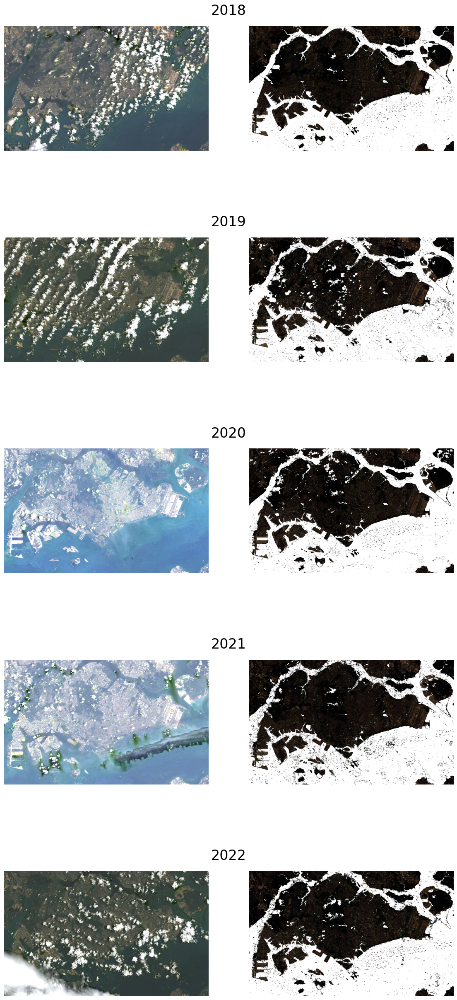

In [67]:
### Plot before/after moisaicking
fig, ax = plt.subplots(nrows = 5, ncols = 2, figsize = (14, 32))

axs = ax.flatten()

years = [str(year) for year in range(2018, 2023)]

for axis_num, axis in enumerate(axs):
    axis.axis("off")
    if axis_num % 2 == 0:
        target_file = glob(os.path.join(os.getcwd(), "data_collated", f"{years[axis_num//2]}", "**/*STACKED.tif"), recursive = True)[0]
        
        with rio.open(target_file) as src:
            image = src.read((4,3,2))
            src.close()
        
        scaled_image = image * 0.0000275 - 0.2
        
        show(histogram_stretch(scaled_image, 0, 95), ax = axis)
        
        title = axis.set_title(f"{years[axis_num//2]}", fontsize = 24, pad = 20)
        
        title.set_position((1.1, 1.2))
    
    else:
        scaled_image = base_scenes[axis_num//2 + 5] * 0.0000275 - 0.2
        
        scaled_image = np.ma.filled(scaled_image, fill_value = 1)
        
        show(histogram_stretch(scaled_image[[3,2,1], ...], 5, 95), ax = axis)

In [41]:
1//2

0

In [40]:
glob(os.path.join(os.getcwd(), "data_collated", f"{2013}", "**/*STACKED.tif"), recursive = True)[0]

'C:\\Users\\Jonny\\Desktop\\Jupyter Projects\\Singapore NDVI\\data_collated\\2013\\LC08_L2SP_125059_20130424_20200912_02_T1_STACKED.tif'

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


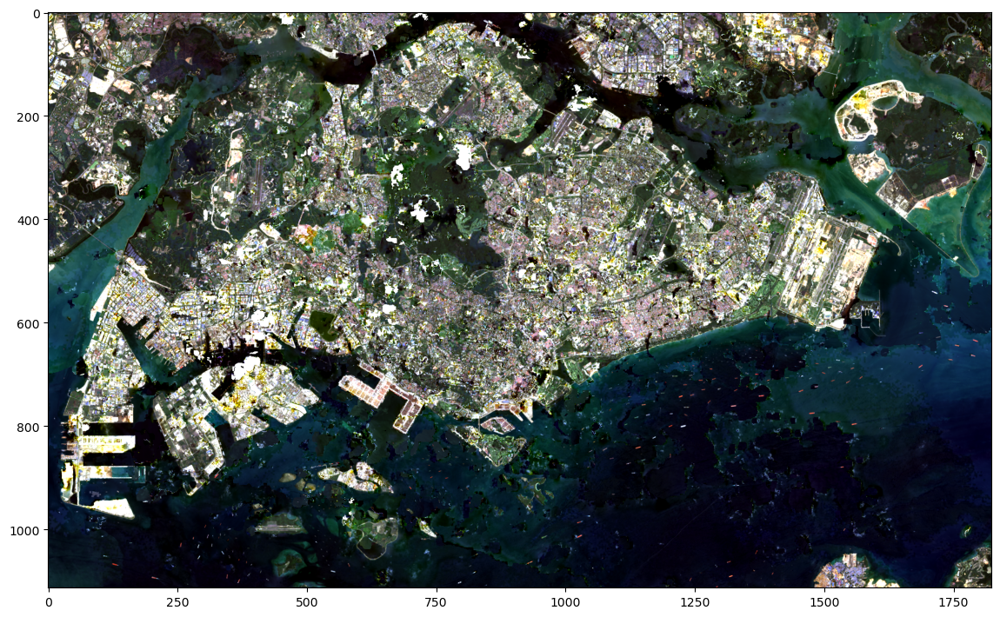

<Axes: >

In [45]:
scaled_stack = final_scene * 0.0000275 - 0.2

# remember that histogram_stretch does not work with masked arrays
# scaled_stack = np.ma.filled(scaled_stack, fill_value = 0)
scaled_stack = np.ma.filled(scaled_stack, fill_value = 1)
# tcc = reshape_as_image(histogram_stretch(scaled_stack[[3,2,1], ...], min_vals = 10, max_vals = 90))
tcc = histogram_stretch(scaled_stack[[3,2,1], ...], min_vals = 5, max_vals = 95)

fig, ax = plt.subplots(figsize = (14,14))
# plt.imshow(reshape_as_image(scaled_stack[[3,2,1],...]))
# plt.imshow(tcc)
show(tcc)